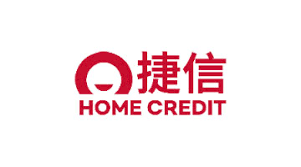

In [1]:
from IPython.display import Image
Image(filename='./Home Credit logo.png', width=700, height=100)

In [2]:
import pandas as pd # package for high-performance, easy-to-use data structures and data analysis
import numpy as np # fundamental package for scientific computing with Python
import matplotlib
import matplotlib.pyplot as plt # for plotting
import seaborn as sns # for making plots with seaborn

color = sns.color_palette()

import plotly.offline as py
#py.init_notebook_mode(connected=True)

from plotly.offline import init_notebook_mode, iplot
#init_notebook_mode(connected=True)

import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()
# from plotly import tools
# import plotly.tools as tls
# import squarify
# from mpl_toolkits.basemap import Basemap
# from numpy import array
# from matplotlib import cm

# import cufflinks and offline mode
import cufflinks as cf
cf.go_offline()

pd.options.display.max_rows=250
pd.options.display.max_columns=250

In [3]:
import os
print(os.listdir("./Input/"))

['application_test.csv', 'application_train.csv', 'bureau.csv', 'bureau_balance.csv', 'credit_card_balance.csv', 'HomeCredit_columns_description.csv', 'installments_payments.csv', 'POS_CASH_balance.csv', 'previous_application.csv', 'sample_submission.csv']


In [4]:
application_train = pd.read_csv('./Input/application_train.csv')
POS_CASH_balance = pd.read_csv('./Input/POS_CASH_balance.csv')
bureau_balance = pd.read_csv('./Input/bureau_balance.csv')
previous_application = pd.read_csv('./Input/previous_application.csv')
installments_payments = pd.read_csv('./Input/installments_payments.csv')
credit_card_balance = pd.read_csv('./Input/credit_card_balance.csv')
bureau = pd.read_csv('./Input/bureau.csv')
application_test = pd.read_csv('./Input/application_test.csv')

In [5]:
print('Size of application_train data', application_train.shape)
print('Size of POS_CASH_balance data', POS_CASH_balance.shape)
print('Size of bureau_balance data', bureau_balance.shape)
print('Size of previous_application data', previous_application.shape)
print('Size of installments_payments data', installments_payments.shape)
print('Size of credit_card_balance data', credit_card_balance.shape)
print('Size of bureau data', bureau.shape)
print('Size of application_test data', application_test.shape)

('Size of application_train data', (307511, 122))
('Size of POS_CASH_balance data', (10001358, 8))
('Size of bureau_balance data', (27299925, 3))
('Size of previous_application data', (1670214, 37))
('Size of installments_payments data', (13605401, 8))
('Size of credit_card_balance data', (3840312, 23))
('Size of bureau data', (1716428, 17))
('Size of application_test data', (48744, 121))


In [6]:
def get_desc_stats(df):
    desc = df.describe()
    desc.loc['Unique'] = [len(df[col].unique()) for col in desc.columns]
    desc.loc["Missing"] = [df[col].isnull().sum() for col in desc.columns]
    desc.loc['Pct_Missing'] = [(df[col].isnull().sum()/float(df.shape[0])*100) for col in desc.columns]
    return(desc.T)

In [7]:
application_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [8]:
get_desc_stats(application_train)

,count,mean,std,min,25%,50%,75%,max,Unique,Missing,Pct_Missing
SK_ID_CURR,307511.0,278180.518577,102790.175348,1.000020e+05,189145.500000,278202.000000,367142.500000,4.562550e+05,307511.0,0.0,0.000000
TARGET,307511.0,0.080729,0.272419,0.000000e+00,0.000000,0.000000,0.000000,1.000000e+00,2.0,0.0,0.000000
CNT_CHILDREN,307511.0,0.417052,0.722121,0.000000e+00,0.000000,0.000000,1.000000,1.900000e+01,15.0,0.0,0.000000
AMT_INCOME_TOTAL,307511.0,168797.919297,237123.146279,2.565000e+04,112500.000000,147150.000000,202500.000000,1.170000e+08,2548.0,0.0,0.000000
AMT_CREDIT,307511.0,599025.999706,402490.776996,4.500000e+04,270000.000000,513531.000000,808650.000000,4.050000e+06,5603.0,0.0,0.000000
AMT_ANNUITY,307499.0,27108.573909,14493.737315,1.615500e+03,16524.000000,24903.000000,34596.000000,2.580255e+05,13673.0,12.0,0.003902
AMT_GOODS_PRICE,307233.0,538396.207429,369446.460540,4.050000e+04,238500.000000,450000.000000,679500.000000,4.050000e+06,1003.0,278.0,0.090403
REGION_POPULATION_RELATIVE,307511.0,0.020868,0.013831,2.900000e-04,0.010006,0.018850,0.028663,7.250800e-02,81.0,0.0,0.000000
DAYS_BIRTH,307511.0,-16036.995067,4363.988632,-2.522900e+04,-19682.000000,-15750.000000,-12413.000000,-7.489000e+03,17460.0,0.0,0.000000
DAYS_EMPLOYED,307511.0,63815.045904,141275.766519,-1.791200e+04,-2760.000000,-1213.000000,-289.000000,3.652430e+05,12574.0,0.0,0.000000


In [9]:
POS_CASH_balance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


In [10]:
get_desc_stats(POS_CASH_balance)

,count,mean,std,min,25%,50%,75%,max,Unique,Missing,Pct_Missing
SK_ID_PREV,10001358.0,1.903217e+06,535846.530722,1000001.0,1434405.0,1896565.0,2368963.0,2843499.0,936325.0,0.0,0.000000
SK_ID_CURR,10001358.0,2.784039e+05,102763.745090,100001.0,189550.0,278654.0,367429.0,456255.0,337252.0,0.0,0.000000
MONTHS_BALANCE,10001358.0,-3.501259e+01,26.066570,-96.0,-54.0,-28.0,-13.0,-1.0,96.0,0.0,0.000000
CNT_INSTALMENT,9975287.0,1.708965e+01,11.995056,1.0,10.0,12.0,24.0,92.0,74.0,26071.0,0.260675
CNT_INSTALMENT_FUTURE,9975271.0,1.048384e+01,11.109058,0.0,3.0,7.0,14.0,85.0,80.0,26087.0,0.260835
SK_DPD,10001358.0,1.160693e+01,132.714043,0.0,0.0,0.0,0.0,4231.0,3400.0,0.0,0.000000
SK_DPD_DEF,10001358.0,6.544684e-01,32.762491,0.0,0.0,0.0,0.0,3595.0,2307.0,0.0,0.000000


In [11]:
bureau_balance.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [12]:
get_desc_stats(bureau_balance)

,count,mean,std,min,25%,50%,75%,max,Unique,Missing,Pct_Missing
SK_ID_BUREAU,27299925.0,6.036297e+06,492348.856904,5001709.0,5730933.0,6070821.0,6431951.0,6842888.0,817395.0,0.0,0.0
MONTHS_BALANCE,27299925.0,-3.074169e+01,23.864509,-96.0,-46.0,-25.0,-11.0,0.0,97.0,0.0,0.0


In [13]:
previous_application.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
get_desc_stats(previous_application)

,count,mean,std,min,25%,50%,75%,max,Unique,Missing,Pct_Missing
SK_ID_PREV,1670214.0,1.923089e+06,532597.958696,1.000001e+06,1.461857e+06,1.923110e+06,2.384280e+06,2845382.000,1670214.0,0.0,0.000000
SK_ID_CURR,1670214.0,2.783572e+05,102814.823849,1.000010e+05,1.893290e+05,2.787145e+05,3.675140e+05,456255.000,338857.0,0.0,0.000000
AMT_ANNUITY,1297979.0,1.595512e+04,14782.137335,0.000000e+00,6.321780e+03,1.125000e+04,2.065842e+04,418058.145,357960.0,372235.0,22.286665
AMT_APPLICATION,1670214.0,1.752339e+05,292779.762387,0.000000e+00,1.872000e+04,7.104600e+04,1.803600e+05,6905160.000,93885.0,0.0,0.000000
AMT_CREDIT,1670213.0,1.961140e+05,318574.616546,0.000000e+00,2.416050e+04,8.054100e+04,2.164185e+05,6905160.000,86804.0,1.0,0.000060
AMT_DOWN_PAYMENT,774370.0,6.697402e+03,20921.495410,-9.000000e-01,0.000000e+00,1.638000e+03,7.740000e+03,3060045.000,29279.0,895844.0,53.636480
AMT_GOODS_PRICE,1284699.0,2.278473e+05,315396.557937,0.000000e+00,5.084100e+04,1.123200e+05,2.340000e+05,6905160.000,93886.0,385515.0,23.081773
HOUR_APPR_PROCESS_START,1670214.0,1.248418e+01,3.334028,0.000000e+00,1.000000e+01,1.200000e+01,1.500000e+01,23.000,24.0,0.0,0.000000
NFLAG_LAST_APPL_IN_DAY,1670214.0,9.964675e-01,0.059330,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000,2.0,0.0,0.000000
RATE_DOWN_PAYMENT,774370.0,7.963682e-02,0.107823,-1.497876e-05,0.000000e+00,5.160508e-02,1.089091e-01,1.000,207034.0,895844.0,53.636480


In [15]:
installments_payments.head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


In [16]:
get_desc_stats(installments_payments)

,count,mean,std,min,25%,50%,75%,max,Unique,Missing,Pct_Missing
SK_ID_PREV,13605401.0,1.903365e+06,536202.905546,1000001.0,1434191.000,1896520.000,2369094.000,2843499.000,997752.0,0.0,0.000000
SK_ID_CURR,13605401.0,2.784449e+05,102718.310411,100001.0,189639.000,278685.000,367530.000,456255.000,339587.0,0.0,0.000000
NUM_INSTALMENT_VERSION,13605401.0,8.566373e-01,1.035216,0.0,0.000,1.000,1.000,178.000,65.0,0.0,0.000000
NUM_INSTALMENT_NUMBER,13605401.0,1.887090e+01,26.664067,1.0,4.000,8.000,19.000,277.000,277.0,0.0,0.000000
DAYS_INSTALMENT,13605401.0,-1.042270e+03,800.946284,-2922.0,-1654.000,-818.000,-361.000,-1.000,2922.0,0.0,0.000000
DAYS_ENTRY_PAYMENT,13602496.0,-1.051114e+03,800.585883,-4921.0,-1662.000,-827.000,-370.000,-1.000,3040.0,2905.0,0.021352
AMT_INSTALMENT,13605401.0,1.705091e+04,50570.254429,0.0,4226.085,8884.080,16710.210,3771487.845,902539.0,0.0,0.000000
AMT_PAYMENT,13602496.0,1.723822e+04,54735.783981,0.0,3398.265,8125.515,16108.425,3771487.845,944236.0,2905.0,0.021352


In [17]:
credit_card_balance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,1800.0,1800.0,0.000,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,2250.0,2250.0,60175.080,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,2250.0,2250.0,26926.425,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,11925.0,11925.0,224949.285,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,27000.0,27000.0,443044.395,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


In [18]:
get_desc_stats(credit_card_balance)

,count,mean,std,min,25%,50%,75%,max,Unique,Missing,Pct_Missing
SK_ID_PREV,3840312.0,1.904504e+06,536469.470563,1000018.000,1434385.00,1897122.0,2.369328e+06,2843496.000,104307.0,0.0,0.000000
SK_ID_CURR,3840312.0,2.783242e+05,102704.475133,100006.000,189517.00,278396.0,3.675800e+05,456250.000,103558.0,0.0,0.000000
MONTHS_BALANCE,3840312.0,-3.452192e+01,26.667751,-96.000,-55.00,-28.0,-1.100000e+01,-1.000,96.0,0.0,0.000000
AMT_BALANCE,3840312.0,5.830016e+04,106307.031025,-420250.185,0.00,0.0,8.904669e+04,1505902.185,1347904.0,0.0,0.000000
AMT_CREDIT_LIMIT_ACTUAL,3840312.0,1.538080e+05,165145.699523,0.000,45000.00,112500.0,1.800000e+05,1350000.000,181.0,0.0,0.000000
AMT_DRAWINGS_ATM_CURRENT,3090496.0,5.961325e+03,28225.688579,-6827.310,0.00,0.0,0.000000e+00,2115000.000,2268.0,749816.0,19.524872
AMT_DRAWINGS_CURRENT,3840312.0,7.433388e+03,33846.077334,-6211.620,0.00,0.0,0.000000e+00,2287098.315,187005.0,0.0,0.000000
AMT_DRAWINGS_OTHER_CURRENT,3090496.0,2.881696e+02,8201.989345,0.000,0.00,0.0,0.000000e+00,1529847.000,1833.0,749816.0,19.524872
AMT_DRAWINGS_POS_CURRENT,3090496.0,2.968805e+03,20796.887047,0.000,0.00,0.0,0.000000e+00,2239274.160,168749.0,749816.0,19.524872
AMT_INST_MIN_REGULARITY,3535076.0,3.540204e+03,5600.154122,0.000,0.00,0.0,6.633911e+03,202882.005,312267.0,305236.0,7.948208


In [19]:
bureau.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [20]:
get_desc_stats(bureau)

,count,mean,std,min,25%,50%,75%,max,Unique,Missing,Pct_Missing
SK_ID_CURR,1716428.0,2.782149e+05,1.029386e+05,100001.000,188866.75,278055.0,367426.00,4.562550e+05,305811.0,0.0,0.000000
SK_ID_BUREAU,1716428.0,5.924434e+06,5.322657e+05,5000000.000,5463953.75,5926303.5,6385681.25,6.843457e+06,1716428.0,0.0,0.000000
DAYS_CREDIT,1716428.0,-1.142108e+03,7.951649e+02,-2922.000,-1666.00,-987.0,-474.00,0.000000e+00,2923.0,0.0,0.000000
CREDIT_DAY_OVERDUE,1716428.0,8.181666e-01,3.654443e+01,0.000,0.00,0.0,0.00,2.792000e+03,942.0,0.0,0.000000
DAYS_CREDIT_ENDDATE,1610875.0,5.105174e+02,4.994220e+03,-42060.000,-1138.00,-330.0,474.00,3.119900e+04,14097.0,105553.0,6.149573
DAYS_ENDDATE_FACT,1082775.0,-1.017437e+03,7.140106e+02,-42023.000,-1489.00,-897.0,-425.00,0.000000e+00,2918.0,633653.0,36.916958
AMT_CREDIT_MAX_OVERDUE,591940.0,3.825418e+03,2.060316e+05,0.000,0.00,0.0,0.00,1.159872e+08,68252.0,1124488.0,65.513264
CNT_CREDIT_PROLONG,1716428.0,6.410406e-03,9.622391e-02,0.000,0.00,0.0,0.00,9.000000e+00,10.0,0.0,0.000000
AMT_CREDIT_SUM,1716415.0,3.549946e+05,1.149811e+06,0.000,51300.00,125518.5,315000.00,5.850000e+08,236709.0,13.0,0.000757
AMT_CREDIT_SUM_DEBT,1458759.0,1.370851e+05,6.774011e+05,-4705600.320,0.00,0.0,40153.50,1.701000e+08,226538.0,257669.0,15.011932


In [21]:
# Data Exploration

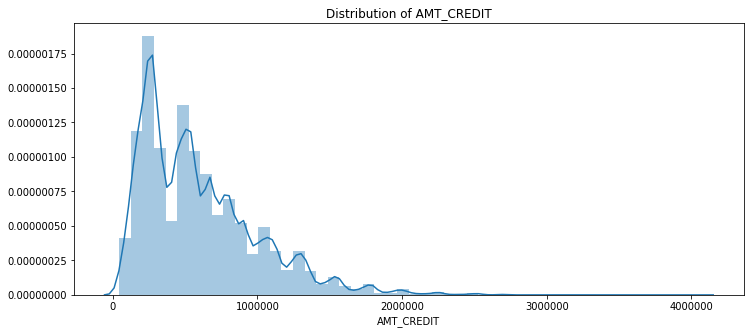

In [22]:
plt.figure(figsize=(12,5))
plt.title("Distribution of AMT_CREDIT")
ax = sns.distplot(application_train["AMT_CREDIT"])

In [23]:
#Is Amount_credit different for each contract type?

In [24]:
application_train['TARGET'].value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

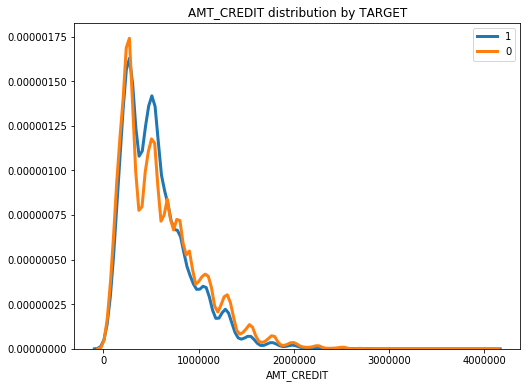

In [25]:
def plot_dist_plot(cat_var,num_var):    
    var_values = list(application_train[cat_var].unique())
    plt.figure(figsize=(8,6))

    for val in var_values:
        subset = application_train.loc[application_train[cat_var] == val]

        sns.distplot(subset[num_var], hist=False, kde = True, kde_kws={'linewidth':3}, label=val)

    plt.legend(prop ={'size':10})
    plt.title(num_var +' distribution by '+cat_var)
    
plot_dist_plot(cat_var = 'TARGET', num_var='AMT_CREDIT')

In [26]:
#Credit amount 300K to 700K seems to have higher repayment issues. Lets zoom in and see how the distribution looks like

C:\Users\pallavisahoo\AppData\Local\Continuum\anaconda2\lib\site-packages\statsmodels\nonparametric\kde.py:454: RuntimeWarning:

invalid value encountered in greater

C:\Users\pallavisahoo\AppData\Local\Continuum\anaconda2\lib\site-packages\statsmodels\nonparametric\kde.py:454: RuntimeWarning:

invalid value encountered in less



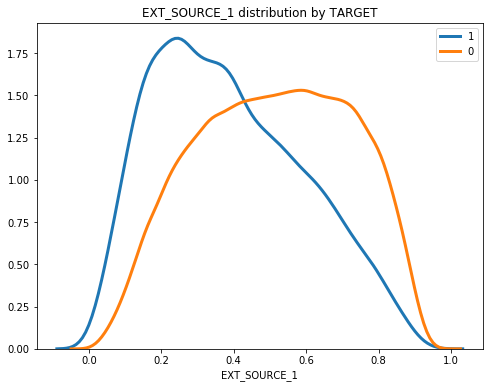

In [27]:
plot_dist_plot(cat_var = 'TARGET', num_var='EXT_SOURCE_1')

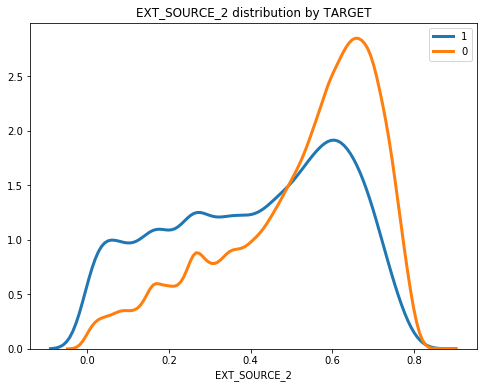

In [28]:
plot_dist_plot(cat_var = 'TARGET', num_var='EXT_SOURCE_2')

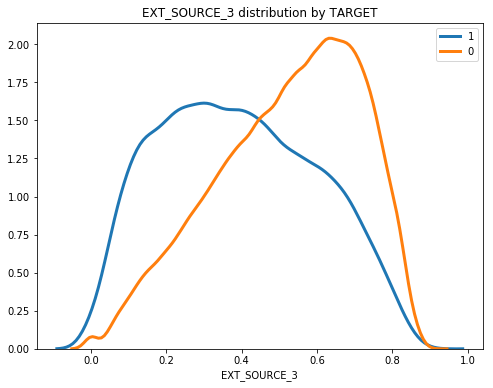

In [29]:
plot_dist_plot(cat_var = 'TARGET', num_var='EXT_SOURCE_3')

(0, 20000)

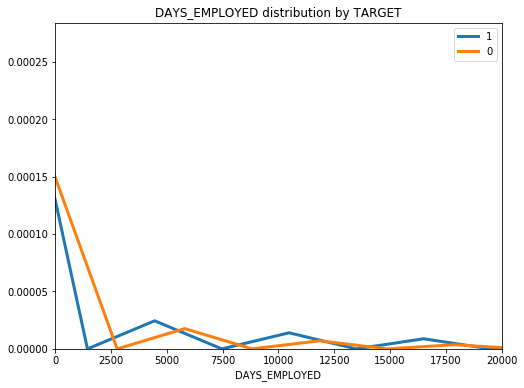

In [30]:
plot_dist_plot(cat_var = 'TARGET', num_var='DAYS_EMPLOYED')
plt.xlim(0,20000)

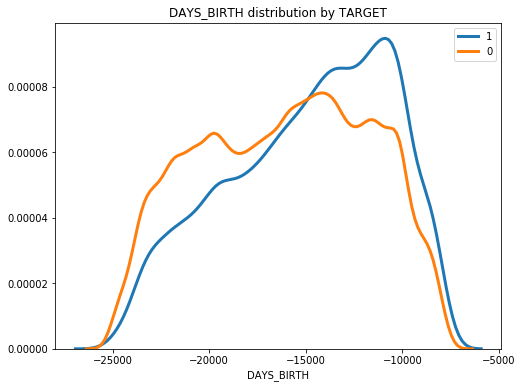

In [31]:
plot_dist_plot(cat_var = 'TARGET', num_var='DAYS_BIRTH')

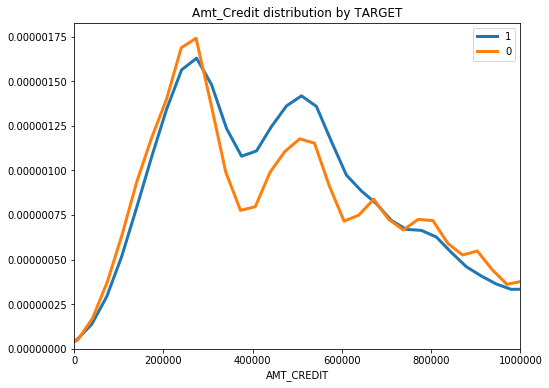

In [32]:
def plot_dist_plot(cat_var,num_var):    
    var_values = list(application_train[cat_var].unique())
    plt.figure(figsize=(8,6))

    for val in var_values:
        subset = application_train.loc[application_train[cat_var] == val]

        sns.distplot(subset[num_var], hist=False, kde = True, kde_kws={'linewidth':3}, label=val)

    plt.legend(prop ={'size':10})
    plt.title('Amt_Credit distribution by '+cat_var)
    plt.xlim(0,1000000)
plot_dist_plot(cat_var = 'TARGET', num_var='AMT_CREDIT')

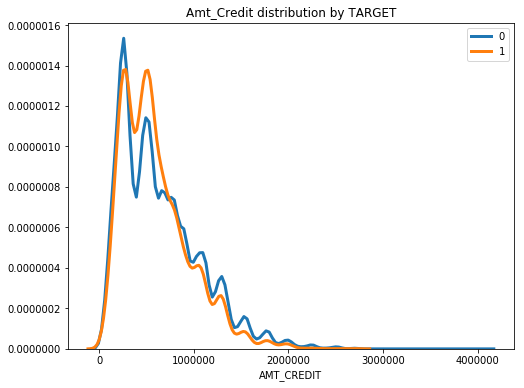

In [33]:
def plot_dist_plot(cat_var,num_var):    
    var_values = list(application_train.loc[application_train['NAME_FAMILY_STATUS'] == 'Married'][cat_var].unique())
    plt.figure(figsize=(8,6))

    for val in var_values:
        subset = application_train.loc[(application_train['NAME_FAMILY_STATUS'] == 'Married') & (application_train[cat_var] == val)]

        sns.distplot(subset[num_var], hist=False, kde = True, kde_kws={'linewidth':3}, label=val)

    plt.legend(prop ={'size':10})
    plt.title('Amt_Credit distribution by '+cat_var)
plot_dist_plot(cat_var = 'TARGET', num_var='AMT_CREDIT')

In [34]:
#There are more defaults for amounts ranging from 400-700K

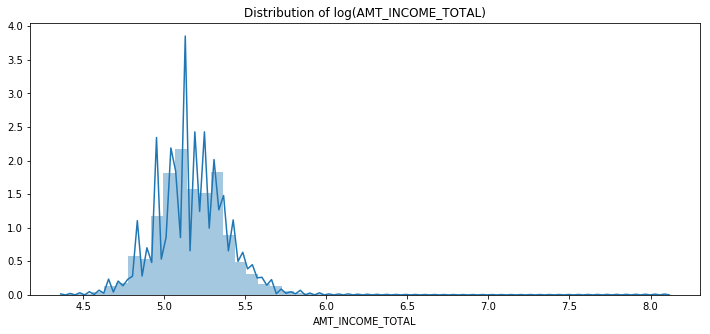

In [35]:
plt.figure(figsize=(12,5))
plt.title("Distribution of log(AMT_INCOME_TOTAL)")
sns.distplot(np.log10(application_train['AMT_INCOME_TOTAL']))

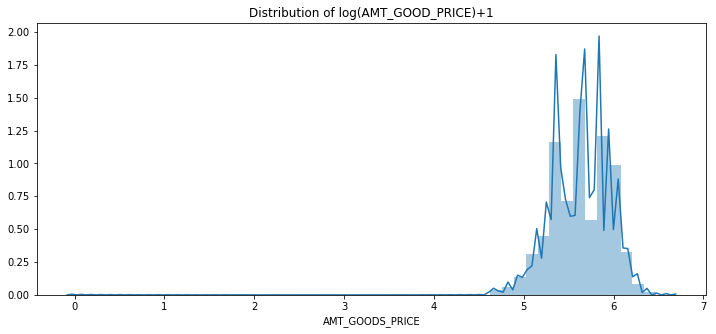

In [36]:
plt.figure(figsize=(12,5))
plt.title("Distribution of log(AMT_GOOD_PRICE)+1")
sns.distplot(np.log10((application_train['AMT_GOODS_PRICE'].fillna(0))+1))

In [37]:
temp = application_train["NAME_TYPE_SUITE"].value_counts()
#print temp, trace
#print("Total number of states : ",len(temp))
trace = go.Bar(
    x = temp.index,
    y = (temp / temp.sum())*100,
)
data = [trace]
layout = go.Layout(
    title = "Who accompanied client when applying for the  application in % ",
    xaxis=dict(
        title='Name of type of the Suite',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count of Name of type of the Suite in %',
#         titlefont=dict(
#             size=16,
#             color='rgb(107, 107, 107)'
#         ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='schoolStateNames')

In [38]:
temp = application_train["NAME_CONTRACT_TYPE"].value_counts()
fig = {
  "data": [
    {
      "values": temp.values,
      "labels": temp.index,
      "domain": {"x": [0, .8]},
      #"name": "Types of Loans",
      #"hoverinfo":"label+percent+name",
      "hole": .6,
      "type": "pie"
    },
    
    ],
  "layout": {
        "title":"Types of loan",
        "annotations": [
            {
                "font": {
                    "size": 20
                },
                "showarrow": False,
                "text": "Loan Types",
                "x": 0.4,
                "y": 0.5
            }
            
        ]
    }
}
iplot(fig, filename='donut')

In [39]:
application_train.groupby(['NAME_CONTRACT_TYPE'])['TARGET'].sum() /application_train.groupby(['NAME_CONTRACT_TYPE'])['TARGET'].count()

NAME_CONTRACT_TYPE
Cash loans         0.083459
Revolving loans    0.054783
Name: TARGET, dtype: float64

In [40]:
#Cash loans have more defaults than recolving loans

In [41]:
#Purpose of the loan

temp1 = application_train["FLAG_OWN_CAR"].value_counts()
temp2 = application_train["FLAG_OWN_REALTY"].value_counts()

fig = {
  "data": [
    {
      "values": temp1.values,
      "labels": temp1.index,
      "domain": {"x": [0, .48]},
      "name": "Own Car",
      "hoverinfo":"label+percent+name",
      "hole": .6,
      "type": "pie"
    },
    {
      "values": temp2.values,
      "labels": temp2.index,
      "text":"Own Realty",
      "textposition":"inside",
      "domain": {"x": [.52, 1]},
      "name": "Own Reality",
      "hoverinfo":"label+percent+name",
      "hole": .6,
      "type": "pie"
    }],
  "layout": {
        "title":"Purpose of loan",
        "annotations": [
            {
                "font": {
                    "size": 20
                },
                "showarrow": False,
                "text": "Own Car",
                "x": 0.20,
                "y": 0.5
            },
            {
                "font": {
                    "size": 20
                },
                "showarrow": False,
                "text": "Own Realty",
                "x": 0.8,
                "y": 0.5
            }
        ]
    }
}
iplot(fig, filename='donut')

In [42]:
application_train.groupby(['FLAG_OWN_CAR'])['TARGET'].sum() / (application_train.groupby(['FLAG_OWN_CAR'])['TARGET'].count())

FLAG_OWN_CAR
N    0.085002
Y    0.072437
Name: TARGET, dtype: float64

In [43]:
application_train.groupby(['FLAG_OWN_REALTY'])['TARGET'].sum() / (application_train.groupby(['FLAG_OWN_REALTY'])['TARGET'].count())

FLAG_OWN_REALTY
N    0.083249
Y    0.079616
Name: TARGET, dtype: float64

In [44]:
#Income source of applicant

temp = application_train["NAME_INCOME_TYPE"].value_counts()
fig = {
  "data": [
    {
      "values": temp.values,
      "labels": temp.index,
      "domain": {"x": [0, .8]},
      #"name": "Types of Loans",
      #"hoverinfo":"label+percent+name",
      "hole": .6,
      "type": "pie"
    },
    
    ],
  "layout": {
        "title":"Main Income source of applicant",
        "annotations": [
            {
                "font": {
                    "size": 20
                },
                "showarrow": False,
                "text": "Income source",
                "x": 0.4,
                "y": 0.5
            }
            
        ]
    }
}
iplot(fig, filename='donut')

(array([0, 1, 2, 3, 4, 5, 6, 7]), <a list of 8 Text xticklabel objects>)

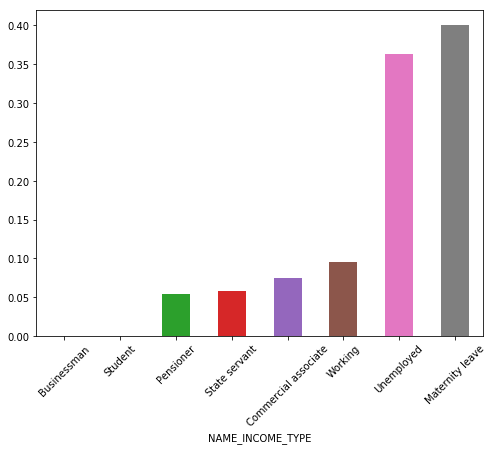

In [45]:
plt.figure(figsize=(8,6))
temp =application_train.groupby(['NAME_INCOME_TYPE'])['TARGET'].sum() / (application_train.groupby(['NAME_INCOME_TYPE'])['TARGET'].count())
temp = temp.sort_values()
temp.plot(kind='bar')
plt.xticks(rotation=45)

In [46]:
#Family status of applicant

temp = application_train["NAME_FAMILY_STATUS"].value_counts()
fig = {
  "data": [
    {
      "values": temp.values,
      "labels": temp.index,
      "domain": {"x": [0, .8]},
      #"name": "Types of Loans",
      #"hoverinfo":"label+percent+name",
      "hole": .6,
      "type": "pie"
    },
    
    ],
  "layout": {
        "title":"Main applicants family status",
        "annotations": [
            {
                "font": {
                    "size": 20
                },
                "showarrow": False,
                "text": "Family status",
                "x": 0.4,
                "y": 0.5
            }
            
        ]
    }
}
iplot(fig, filename='donut')

(array([0, 1, 2, 3, 4, 5]), <a list of 6 Text xticklabel objects>)

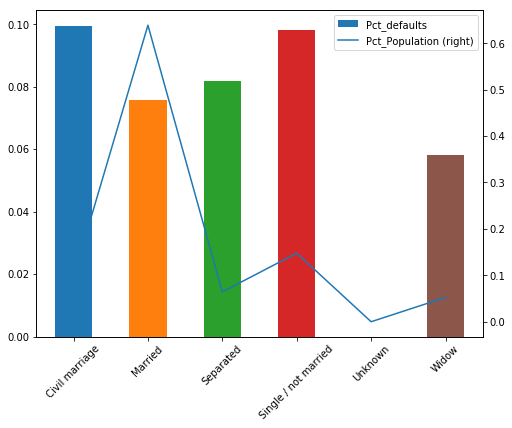

In [47]:
plt.figure(figsize=(8,6))
temp =application_train.groupby(['NAME_FAMILY_STATUS'])['TARGET'].sum() / (application_train.groupby(['NAME_FAMILY_STATUS'])['TARGET'].count())
temp1 = application_train["NAME_FAMILY_STATUS"].value_counts(normalize=True)
temp2 = pd.concat([temp, temp1], axis=1).reset_index()
temp2.columns = ['NAME_FAMILY_STATUS','Pct_defaults','Pct_Population' ]
#temp2 = temp2.sort_values(by='Pct_defaults')
ax = temp2['Pct_defaults'].plot(kind='bar',legend=True)
ax2 = temp2['Pct_Population'].plot(secondary_y=True, kind='line',legend=True)
ax.set_xticklabels(temp2.NAME_FAMILY_STATUS, rotation=45)
plt.xticks(rotation=45)

In [48]:
temp = application_train["OCCUPATION_TYPE"].value_counts()
temp.iplot(kind='bar', xTitle = 'Occupation', yTitle = "Count", title = 'Occupation of Applicant\'s who applied for loan', 
           color = 'green')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17]), <a list of 18 Text xticklabel objects>)

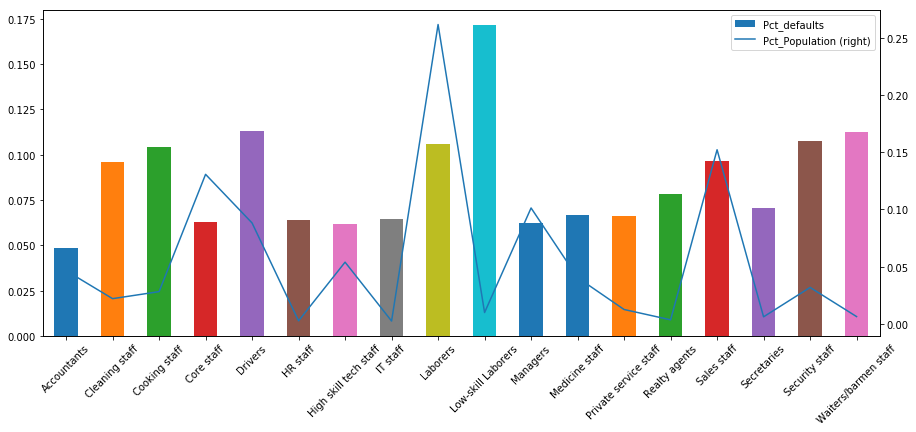

In [49]:
plt.figure(figsize=(15,6))
temp =application_train.groupby(['OCCUPATION_TYPE'])['TARGET'].sum() / (application_train.groupby(['OCCUPATION_TYPE'])['TARGET'].count())
temp1 = application_train["OCCUPATION_TYPE"].value_counts(normalize=True)
temp2 = pd.concat([temp, temp1], axis=1).reset_index()
temp2.columns = ['OCCUPATION_TYPE','Pct_defaults','Pct_Population' ]
#temp2 = temp2.sort_values(by='Pct_defaults')
ax = temp2['Pct_defaults'].plot(kind='bar',legend=True)
ax2 = temp2['Pct_Population'].plot(secondary_y=True, kind='line',legend=True)
ax.set_xticklabels(temp2.OCCUPATION_TYPE, rotation=45)
plt.xticks(rotation=45)

In [50]:
temp = application_train["NAME_EDUCATION_TYPE"].value_counts(normalize=True)
temp.iplot(kind='bar', xTitle = 'Occupation', yTitle = "Count", title = 'Occupation of Applicant\'s who applied for loan', color = 'green')

In [51]:
def plot_pct_def_pct_pop(var):
    plt.figure(figsize=(15,6))
    temp =application_train.groupby([var])['TARGET'].sum() / (application_train.groupby([var])['TARGET'].count())
    temp1 = application_train[var].value_counts(normalize=True)
    temp2 = pd.concat([temp, temp1], axis=1).reset_index()
    temp2.columns = [var,'Pct_defaults','Pct_Population' ]
    #temp2 = temp2.sort_values(by='Pct_defaults')
    ax = temp2['Pct_defaults'].plot(kind='bar',legend=True)
    ax2 = temp2['Pct_Population'].plot(secondary_y=True, kind='line',legend=True)
    ax.set_xticklabels(temp2[var], rotation=45)
    plt.xticks(rotation=45)

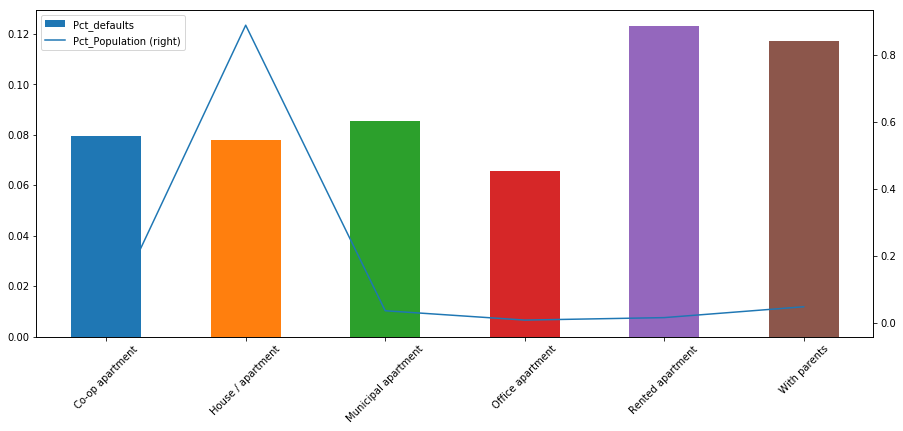

In [52]:
plot_pct_def_pct_pop('NAME_HOUSING_TYPE')

In [53]:
temp = application_train["ORGANIZATION_TYPE"].value_counts(normalize=True)
temp.iplot(kind='bar', xTitle = 'Organization Name', yTitle = "Count", title = 'Types of Organizations who applied for loan ', color = 'red')

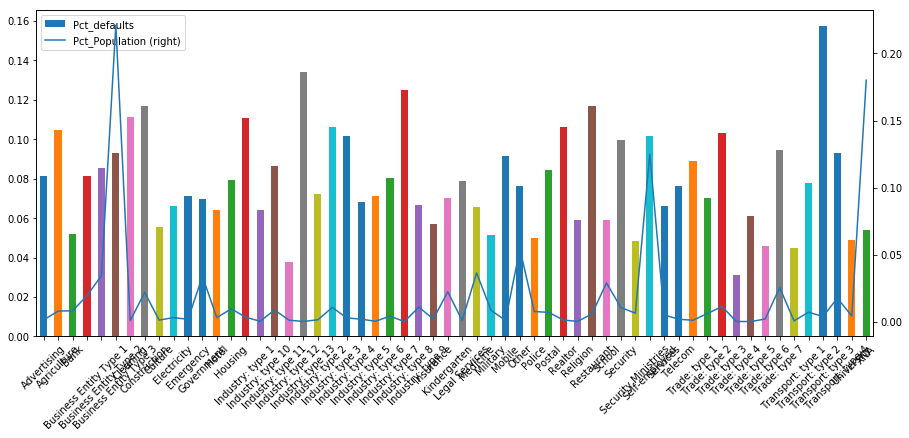

In [54]:
plot_pct_def_pct_pop('ORGANIZATION_TYPE')

In [55]:
bureau_balance.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [56]:
bureau_balance['STATUS'].value_counts()

C    13646993
0     7499507
X     5810482
1      242347
5       62406
2       23419
3        8924
4        5847
Name: STATUS, dtype: int64

In [57]:
bureau_balance = pd.concat([bureau_balance, pd.get_dummies(bureau_balance.STATUS, prefix='BB_status')], axis=1).drop('STATUS', axis=1)   

In [58]:
bureau_balance.head()

,SK_ID_BUREAU,MONTHS_BALANCE,BB_status_0,BB_status_1,BB_status_2,BB_status_3,BB_status_4,BB_status_5,BB_status_C,BB_status_X
0,5715448,0,0,0,0,0,0,0,1,0
1,5715448,-1,0,0,0,0,0,0,1,0
2,5715448,-2,0,0,0,0,0,0,1,0
3,5715448,-3,0,0,0,0,0,0,1,0
4,5715448,-4,0,0,0,0,0,0,1,0


In [59]:
print('Counting buros')
bureau_counts = bureau_balance[['SK_ID_BUREAU', 'MONTHS_BALANCE']].groupby('SK_ID_BUREAU').count()
bureau_balance['buro_count'] = bureau_balance['SK_ID_BUREAU'].map(bureau_counts['MONTHS_BALANCE'])
bureau_balance.head()

Counting buros


,SK_ID_BUREAU,MONTHS_BALANCE,BB_status_0,BB_status_1,BB_status_2,BB_status_3,BB_status_4,BB_status_5,BB_status_C,BB_status_X,buro_count
0,5715448,0,0,0,0,0,0,0,1,0,27
1,5715448,-1,0,0,0,0,0,0,1,0,27
2,5715448,-2,0,0,0,0,0,0,1,0,27
3,5715448,-3,0,0,0,0,0,0,1,0,27
4,5715448,-4,0,0,0,0,0,0,1,0,27


In [60]:
print('averaging buro bal')
avg_buro_bal = bureau_balance.groupby('SK_ID_BUREAU').mean()

averaging buro bal


In [61]:
avg_buro_bal.head()

,MONTHS_BALANCE,BB_status_0,BB_status_1,BB_status_2,BB_status_3,BB_status_4,BB_status_5,BB_status_C,BB_status_X,buro_count
SK_ID_BUREAU,,,,,,,,,,
5001709,-48.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.886598,0.113402,97.0
5001710,-41.0,0.060241,0.0,0.0,0.0,0.0,0.0,0.578313,0.361446,83.0
5001711,-1.5,0.750000,0.0,0.0,0.0,0.0,0.0,0.000000,0.250000,4.0
5001712,-9.0,0.526316,0.0,0.0,0.0,0.0,0.0,0.473684,0.000000,19.0
5001713,-10.5,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,22.0


In [62]:
avg_buro_bal.columns = ['avg_buro_' + f_ for f_ in avg_buro_bal.columns]
del bureau_balance

In [236]:
import gc
gc.collect()

11306